In [82]:
import jax.numpy as np
from jax import jit, grad, vmap, value_and_grad
import numpy as onp
import meshzoo
import plotly
import plotly.graph_objs as go
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm_notebook

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Draw

from scipy.spatial.distance import cdist

In [2]:
def golden_spiral(num_pts, radius):
    if radius==0:
        return np.array([[0,0,0]])
    indices = np.arange(0, num_pts) + 0.5
    phi = np.arccos(1 - 2*indices/num_pts)
    theta = np.pi * (1 + 5**0.5) * indices
    x, y, z = np.cos(theta) * np.sin(phi), np.sin(theta) * np.sin(phi), np.cos(phi);
    points = np.vstack([x,y,z]).T
    return points*radius

def plotly_scatter(pointsets, sizes=None, opacity=0.8):
    data = []
    #sizes = [np.ones(len(p))*s for p,s in zip(pointsets,sizes)]
    for p, s in zip(pointsets, sizes):
        a,b,c = p[:,0], p[:,1], p[:,2]
        markerparams=dict(size=s,sizemode='area',opacity=opacity)
        trace = go.Scatter3d(x=a, y=b, z=c, mode='markers', marker=markerparams)
        data.append(trace)
    layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 0})
    plot_figure = go.Figure(data=data, layout=layout)
    plotly.offline.iplot(plot_figure)

In [131]:
radius_lookup = {}
radius_lookup['C']=1.7
radius_lookup[6]=1.7

radius_lookup['H']=1.0
radius_lookup[1]=1.0

radius_lookup['N']=1.625
radius_lookup[7]=1.625

radius_lookup['O']=1.49
radius_lookup[8]=1.49

radius_lookup['S']=1.782
radius_lookup[16]=1.782

In [132]:
mol = Chem.MolFromSmiles('CCCCCC1=CC(=C2C3C=C(CCC3C(OC2=C1)(C)C)C)O')
mol = Chem.AddHs(mol)
AllChem.EmbedMolecule(mol)
conf = mol.GetConformer()
#Get coordinates
atom_centres = np.array([list(conf.GetAtomPosition(int(i))) for i in range(mol.GetNumAtoms())])
#put geometric centre at 0,0,0:
atom_centres = (atom_centres - np.mean(atom_centres,0))

#get radius from either rdkit (bad) or amber (good)
#radii = np.array([Chem.GetPeriodicTable().GetRvdw(a.GetAtomicNum()) for a in mol.GetAtoms()])
radii = np.array([radius_lookup[i.GetAtomicNum()] for i in mol.GetAtoms()])

In [385]:
Chem.MolToPDBFile(mol, 'thc.pdb')

In [388]:
import mdtraj as md
pdb = md.load('thc.pdb')
md.shrake_rupley(pdb).sum()

5.8742714

In [398]:
@jit
def E_fn(points1, points2):
    ri = np.expand_dims(points1, 0)
    rj = np.expand_dims(points2, 1)
    dxdydz = np.power(ri - rj, 2)
    dij = np.sqrt(np.sum(dxdydz, axis=-1))
    return dij


@jit
def get_atom_fraction(i, radii, sphere_points, atom_centres):
    translated_sphere_points = sphere_points*(radii[i]+1.4)+atom_centres[i]
    distance_to_all_atoms = E_fn(translated_sphere_points, atom_centres)
    nearest_atoms = distance_to_all_atoms.argsort(0)[0]
    distance_mask =  distance_to_all_atoms.min(0)>(radii[nearest_atoms]-1e-4)
    return distance_mask.sum() / distance_mask.shape[0]

vget_atom_fraction = vmap(get_atom_fraction, in_axes=(0, None, None, None))

In [408]:
#create a spherical mesh made of triangles
points, cells = meshzoo.icosa_sphere(60)
atom_maxmin = onp.max(atom_centres,0)-onp.min(atom_centres,0)
#increase size of mesh to cover all atoms plus a buffer:
points = points*(atom_maxmin+6)/2 #2 angstrom buffer


##Collect all unique bonds:
allbonds = onp.zeros([cells.shape[0]*3,2])
for count, tri in enumerate(cells):
    allbonds[(count*3)][0] = min(tri[0], tri[1])
    allbonds[(count*3)][1] = max(tri[0], tri[1])
    allbonds[(count*3+1)][0] = min(tri[0], tri[2])
    allbonds[(count*3+1)][1] = max(tri[0], tri[2])
    allbonds[(count*3+2)][0] = min(tri[1], tri[2])
    allbonds[(count*3+2)][1] = max(tri[1], tri[2])
    
allbonds = onp.unique(allbonds,axis=0).astype(int)


#No SASA here - using volume instead.

#calculate SASA using the shrake rupley approach:
sphere_points = golden_spiral(1000, 1)
atom_range = np.arange(atom_centres.shape[0])
sasa = (vget_atom_fraction(atom_range, radii+1.4, sphere_points, atom_centres)*4*np.pi*radii**2).sum()


from rdkit.Chem import rdFreeSASA
#sasa = rdFreeSASA.CalcSASA(mol, [float(i) for i in radii], 0)


#Per triangle surface area:
per_tri_sa = sasa / cells.shape[0]
#assuming equilateral triangles, this would be the sidelength that has this area:
optimum_sidelength = (2/3)*(3**0.75)*(per_tri_sa**0.5)

In [409]:
plotly_scatter([atom_centres, points], [10,2])

# First set up a repulsive term to keep the mesh vertices "outside" the atoms. 

In [529]:
##The morse potential has both repulsive and attractive parts. 
@jit    
def morse(distances, depth=1, width=3):
    morse = depth*( 1-np.exp(-width*(distances)) )**2
    return morse

@jit
def lj(distances, radii, epsilon=1):
    inverse = radii / (distances)
    lennard_jones = 4*epsilon*( (inverse)**12 - (inverse)**6)
    return lennard_jones+1

##But for the vacuum-wrap one, you don't need attractive. Just a fast-decaying repulsive term. 
@jit
def repulsive(distances):
    return 1/distances

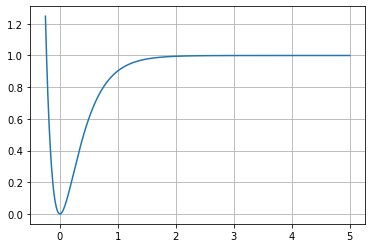

In [505]:
x = np.linspace(-0.25,5,1000)
#plt.ylim(-6,6)
plt.plot(x, morse(x, width=3))
plt.grid()

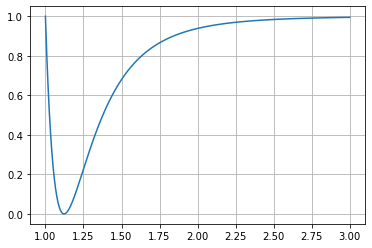

In [506]:
x = np.linspace(1,3,1000)
plt.plot(x, lj(x,1))
plt.grid()

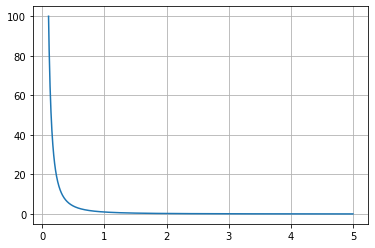

In [507]:
x = np.linspace(0.1,5,1000)
plt.plot(x, repulsive(x**2))
plt.grid()

In [508]:
distances_to_atoms = E_fn(atom_centres, points)-radii
repulsion_term = morse(distances_to_atoms, width=3).sum()
repulsion_term


DeviceArray(1907070.8, dtype=float32)

# Then set up a volume term to reduce volume

In [509]:
@jit
def signed_vol_of_triangle(p1, p2, p3):
    v321 = p3[0]*p2[1]*p1[2]
    v231 = p2[0]*p3[1]*p1[2]
    v312 = p3[0]*p1[1]*p2[2]
    v132 = p1[0]*p3[1]*p2[2]
    v213 = p2[0]*p1[1]*p3[2]
    v123 = p1[0]*p2[1]*p3[2]
    return (1 / 6)*(-v321 + v231 + v312 - v132 - v213 + v123)

@jit
def make_vol(pts):
    return signed_vol_of_triangle(pts[0], pts[1], pts[2])

vmake_vol = vmap(make_vol)

In [510]:
volume = vmake_vol(points[cells]).sum()
print('Volume is:', volume)

Volume is: 1514.4456


# Finally, a term to ensure even mesh using bond distances

In [511]:
##Get an array of all unique bond indices:
allbonds = onp.zeros([cells.shape[0]*3,2])
for count, tri in enumerate(cells):
    allbonds[(count*3)][0] = min(tri[0], tri[1])
    allbonds[(count*3)][1] = max(tri[0], tri[1])
    allbonds[(count*3+1)][0] = min(tri[0], tri[2])
    allbonds[(count*3+1)][1] = max(tri[0], tri[2])
    allbonds[(count*3+2)][0] = min(tri[1], tri[2])
    allbonds[(count*3+2)][1] = max(tri[1], tri[2])    
allbonds = onp.unique(allbonds,axis=0).astype(int)

@jit 
def get_bond_lengths(pos, bonds):
    return np.linalg.norm(pos[bonds][:,0,:]-pos[bonds][:,1,:], axis=1)

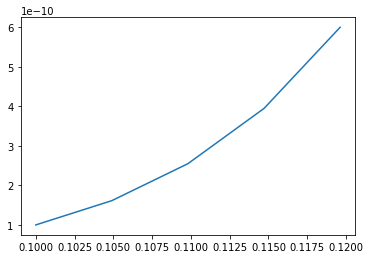

In [512]:
plt.plot(x[:5], x[:5]**10)

# Turn into a single loss function:

In [549]:
@jit
def repulsion_term(vertices, atoms, radii):
    distances_to_atoms = E_fn(atoms, vertices)#-radii
    return lj(distances_to_atoms, radii, epsilon=0.1).sum() / vertices.shape[0]
    #return morse(distances_to_atoms, width=3, depth=0.4).sum() / (vertices.shape[0])
    #return repulsive(distances_to_atoms-radii).sum()

@jit
def volume_term(vertices, triangle_indices):
    volumes = vmake_vol(vertices[triangle_indices])
    return volumes.sum()**2

@jit
def bond_term(vertices, unique_edge_indices):
    bond_lengths = get_bond_lengths(vertices, unique_edge_indices)*20
    #bond_lengths-optimum_sidelength
    #bond_mean = bond_lengths.mean()
    return ( (bond_lengths-optimum_sidelength*15)**2).sum() / unique_edge_indices.shape[0]

@jit
def loss(vertices, atoms, triangle_indices, unique_edge_indices, radii):
    ##First term, stopping mesh going through atoms
    first = repulsion_term(vertices, atoms, radii)
    
    ###Second term, reducing the volume:
    #second = volume_term(vertices, triangle_indices)**(1/3)
    second=0
    
    ##Third term, keeping all bonds the same length:
    third = bond_term(vertices, unique_edge_indices)
    
    return first+second+third
gl = value_and_grad(loss)

# Optimize:

In [550]:
#copy so we don't change the original starting points, making it easier to do repeats
positions = points.copy()

avg_sq_grad = np.zeros_like(positions)
gamma=0.9
eps=1e-8
mass = 1
lr = 0.01 #step size
losses = list()

for _ in tqdm_notebook(range(25000)):
    if _%100==0:
        fig,ax = plt.subplots()
        ax.plot(losses)
        fig.savefig('losses.png')
        plt.close(fig)
    v,g = gl(positions, atom_centres, cells, allbonds, radii)
    avg_sq_grad = avg_sq_grad * gamma + g**2 * (1. - gamma)
    newpos = positions - lr * g / np.sqrt(avg_sq_grad + eps) 
    print(v)
    losses.append(v)
    #print(v,np.max(np.linalg.norm(positions-newpos, axis=1)))
    positions=newpos

<ipython-input-550-89f9ff3b7647>:11: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



53.98809
53.983723
53.981823
53.9878
54.011917
54.043
54.06074
54.059856
54.05535
54.081684
54.131744
54.09619
54.038567
54.00624
53.99174
53.985634
53.98388
53.98433
53.985878
53.988033
53.990524
53.993126
53.995472
53.996914
53.997402
53.997314
53.997265
53.99725
53.996788
53.995403
53.993095
53.990307
53.987465
53.984932
53.983047
53.98202
53.98175
53.98194
53.982258
53.982426
53.982285
53.981796
53.98093
53.97975
53.978348
53.976837
53.97527
53.97379
53.972527
53.971523
53.970745
53.97012
53.969604
53.969105
53.968567
53.967945
53.967255
53.96649
53.965675
53.96473
53.963646
53.962452
53.96125
53.960136
53.95921
53.95848
53.957825
53.957188
53.956505
53.955734
53.954884
53.95398
53.953083
53.95222
53.951424
53.950706
53.950005
53.94923
53.94833
53.947384
53.946438
53.945553
53.944733
53.94399
53.943245
53.942486
53.94172
53.94092
53.940063
53.939182
53.9383
53.93751
53.936794
53.93612
53.93545
53.93475
53.933975
53.933125
53.932198
53.931255
53.930317
53.929443
53.928585
53.927807


53.503345
53.503067
53.502728
53.50232
53.50182
53.50129
53.500782
53.50031
53.499863
53.499413
53.49893
53.498447
53.497967
53.497513
53.497143
53.49686
53.496582
53.496254
53.495907
53.495552
53.495193
53.494846
53.494473
53.49403
53.49353
53.49304
53.492584
53.492176
53.491768
53.491344
53.490936
53.490543
53.490173
53.48982
53.489418
53.48896
53.488476
53.488033
53.48767
53.487362
53.48707
53.486725
53.486336
53.485935
53.48556
53.48524
53.4849
53.484497
53.484005
53.483517
53.483067
53.482647
53.48222
53.481796
53.481384
53.481003
53.480637
53.48031
53.479954
53.479572
53.47914
53.478733
53.478355
53.478035
53.477726
53.477394
53.477016
53.47664
53.47624
53.47581
53.47537
53.474903
53.47444
53.474037
53.473667
53.473305
53.472893
53.472515
53.472157
53.471813
53.47147
53.471115
53.47075
53.47038
53.469994
53.469624
53.469223
53.46877
53.46825
53.467785
53.46741
53.46713
53.466866
53.466568
53.466194
53.465763
53.4653
53.464863
53.464478
53.464123
53.46377
53.46343
53.463104
53.462

53.25257
53.25238
53.25219
53.252007
53.25184
53.251705
53.251553
53.251392
53.251217
53.25103
53.250824
53.250553
53.250328
53.250168
53.249996
53.24981
53.249603
53.249416
53.249207
53.248978
53.248707
53.24845
53.248207
53.247967
53.247746
53.247524
53.247303
53.247097
53.246906
53.24676
53.24667
53.246616
53.246544
53.24644
53.246296
53.246143
53.245953
53.24574
53.2455
53.245235
53.244965
53.244705
53.24444
53.244217
53.244
53.24377
53.243507
53.243263
53.24302
53.242805
53.242607
53.242424
53.242256
53.242123
53.24202
53.241894
53.24174
53.24163
53.24151
53.24134
53.24109
53.240814
53.240578
53.240402
53.2403
53.240177
53.24001
53.239784
53.23956
53.239307
53.239056
53.238766
53.23846
53.238148
53.237892
53.23773
53.23766
53.23761
53.23753
53.23746
53.237377
53.237217
53.23698
53.236725
53.236454
53.236237
53.23605
53.23591
53.235786
53.235653
53.235474
53.23524
53.234978
53.23474
53.23455
53.234344
53.234085
53.23382
53.23359
53.23342
53.233307
53.233196
53.233093
53.232994
53.2

53.122166
53.122055
53.121956
53.12186
53.121788
53.12178
53.121834
53.121876
53.121864
53.121784
53.12166
53.121494
53.121323
53.121147
53.12095
53.12072
53.120476
53.120235
53.12001
53.119804
53.119633
53.119534
53.11953
53.11957
53.119614
53.11961
53.119522
53.11939
53.119232
53.11909
53.118988
53.11892
53.118904
53.11885
53.118748
53.1186
53.118412
53.118206
53.11798
53.11777
53.1176
53.117462
53.11737
53.11731
53.117218
53.117104
53.116993
53.11689
53.116787
53.116673
53.116535
53.1164
53.116276
53.116196
53.11616
53.11612
53.116028
53.115894
53.115757
53.115658
53.115566
53.11548
53.115376
53.115284
53.1152
53.11514
53.115105
53.115044
53.114952
53.114807
53.11462
53.114357
53.114094
53.11387
53.1137
53.113636
53.113617
53.11361
53.113575
53.1135
53.11338
53.11324
53.11308
53.11291
53.112766
53.112648
53.112568
53.112534
53.112476
53.112385
53.11225
53.11206
53.111874
53.111736
53.111652
53.11159
53.111485
53.11136
53.111202
53.111065
53.110954
53.110855
53.11078
53.11069
53.1105

53.045914
53.04565
53.045406
53.0452
53.045067
53.04501
53.045017
53.045063
53.04514
53.045223
53.045258
53.04524
53.045227
53.04523
53.04519
53.045082
53.044964
53.044792
53.044605
53.0444
53.04425
53.044136
53.044056
53.043945
53.043827
53.04375
53.04372
53.04374
53.04377
53.043842
53.04391
53.04396
53.043945
53.04387
53.04375
53.043602
53.04347
53.04333
53.043224
53.043102
53.042957
53.04282
53.0427
53.042625
53.04259
53.04258
53.042583
53.042572
53.042572
53.042538
53.04249
53.042416
53.04237
53.04235
53.04232
53.04226
53.04215
53.04203
53.0419
53.041756
53.04164
53.04157
53.041534
53.041504
53.04147
53.041405
53.041348
53.041306
53.04121
53.041096
53.040985
53.040916
53.04088
53.040825
53.040726
53.040592
53.04048
53.04041
53.040375
53.040348
53.040306
53.04021
53.040108
53.04001
53.039936
53.039867
53.039783
53.039673
53.039604
53.039562
53.03954
53.039513
53.039505
53.03951
53.03953
53.0395
53.039387
53.03921
53.039036
53.038887
53.03883
53.038788
53.03876
53.038723
53.038727
53

52.995495
52.995514
52.995495
52.9954
52.995262
52.995094
52.99494
52.994835
52.994804
52.994785
52.994755
52.99472
52.994686
52.994648
52.99455
52.994373
52.99421
52.994118
52.99414
52.9942
52.99425
52.994278
52.99425
52.994217
52.994164
52.994072
52.99394
52.993847
52.993805
52.993774
52.993744
52.993717
52.993713
52.993713
52.993755
52.99376
52.99374
52.993694
52.99367
52.993668
52.99364
52.99357
52.993443
52.99332
52.99322
52.993156
52.993134
52.993145
52.99317
52.993145
52.993042
52.9929
52.99279
52.99271
52.992664
52.992626
52.992577
52.992516
52.992447
52.992413
52.99242
52.99249
52.992584
52.992676
52.99274
52.992714
52.992615
52.992435
52.992218
52.992
52.99186
52.991802
52.9918
52.991844
52.99189
52.991886
52.991817
52.991722
52.991623
52.991554
52.99155
52.991543
52.991543
52.991573
52.99158
52.99151
52.991398
52.991257
52.991108
52.990997
52.99095
52.990993
52.99111
52.991222
52.991272
52.991207
52.991
52.99077
52.9906
52.990555
52.990578
52.990635
52.99066
52.990704
52.990

52.96082
52.960808
52.96076
52.96066
52.96055
52.960472
52.96044
52.960453
52.96042
52.960308
52.960155
52.96
52.95989
52.959858
52.959904
52.95995
52.960003
52.960033
52.960026
52.959976
52.959877
52.959713
52.95953
52.959393
52.959354
52.959404
52.959427
52.95948
52.95951
52.959522
52.959515
52.959476
52.9594
52.959286
52.959164
52.959087
52.95904
52.959045
52.959038
52.95903
52.959038
52.959045
52.95908
52.95911
52.959095
52.95902
52.958897
52.958813
52.95874
52.95866
52.95853
52.95836
52.95821
52.958126
52.958107
52.9581
52.958076
52.958057
52.95806
52.958103
52.95816
52.958164
52.958122
52.958046
52.95796
52.95786
52.957764
52.95768
52.957645
52.957664
52.957726
52.957775
52.957775
52.957745
52.957695
52.957664
52.957676
52.957684
52.95773
52.957756
52.95776
52.957718
52.957592
52.957413
52.95722
52.9571
52.95704
52.957035
52.95706
52.95716
52.95725
52.95728
52.95723
52.957115
52.956932
52.956745
52.956573
52.956516
52.956566
52.956696
52.95682
52.956947
52.957012
52.956974
52.956

52.92954
52.929577
52.929638
52.929688
52.92966
52.92963
52.92957
52.92948
52.929348
52.929237
52.929153
52.929096
52.928967
52.9288
52.928623
52.92854
52.9286
52.928776
52.928997
52.929195
52.92931
52.92928
52.929188
52.929043
52.928947
52.92889
52.928894
52.928898
52.92886
52.92878
52.928658
52.92847
52.92829
52.928158
52.928093
52.928066
52.92814
52.928265
52.92838
52.928436
52.92845
52.92841
52.928345
52.928288
52.92825
52.92824
52.928215
52.92818
52.92817
52.9282
52.92822
52.928238
52.92824
52.928257
52.928333
52.928413
52.928383
52.928257
52.928074
52.927814
52.927544
52.927334
52.92723
52.92723
52.927315
52.927437
52.927513
52.927525
52.92752
52.927555
52.92763
52.927742
52.927853
52.92795
52.928005
52.92797
52.927883
52.92771
52.927513
52.92734
52.927235
52.927174
52.927135
52.927105
52.9271
52.92711
52.92713
52.9271
52.927036
52.92691
52.926804
52.926716
52.926662
52.926613
52.926624
52.92668
52.92678
52.926857
52.92688
52.9269
52.926968
52.92701
52.926994
52.92691
52.926815
5

52.90859
52.908543
52.90856
52.90858
52.9086
52.90859
52.90863
52.90874
52.90886
52.908867
52.90875
52.90861
52.908527
52.908447
52.908344
52.908222
52.908085
52.90795
52.90786
52.907803
52.907818
52.90792
52.908043
52.90817
52.908257
52.908295
52.908268
52.908184
52.90809
52.908024
52.90799
52.907913
52.907825
52.907734
52.90768
52.90765
52.907623
52.907646
52.907703
52.907776
52.907833
52.90787
52.9079
52.907944
52.90795
52.907917
52.907852
52.907787
52.907738
52.90768
52.907635
52.90759
52.907574
52.907536
52.907482
52.907375
52.90733
52.907326
52.907402
52.907444
52.90744
52.90739
52.90736
52.907333
52.907356
52.907375
52.90735
52.907314
52.907288
52.907288
52.907303
52.907307
52.9073
52.90725
52.907185
52.907104
52.907043
52.90699
52.906982
52.907
52.907085
52.907185
52.90724
52.907223
52.90716
52.90709
52.907005
52.906918
52.906845
52.906796
52.90679
52.906826
52.90687
52.906937
52.906944
52.90692
52.90688
52.90686
52.90679
52.906715
52.906685
52.90674
52.9068
52.906788
52.906708

52.894505
52.894608
52.894764
52.89491
52.894993
52.894978
52.89488
52.894756
52.894665
52.894623
52.894566
52.894516
52.8945
52.894554
52.894615
52.89466
52.894615
52.894573
52.894558
52.894577
52.894608
52.894646
52.89468
52.89466
52.89456
52.894424
52.894306
52.894238
52.89424
52.894268
52.8943
52.894264
52.89418
52.89408
52.89406
52.894077
52.89411
52.89419
52.894302
52.894432
52.894524
52.894547
52.894493
52.8944
52.894287
52.89417
52.89404
52.894
52.894005
52.89404
52.89402
52.89403
52.894035
52.894135
52.894188
52.8942
52.89413
52.894062
52.893974
52.893917
52.893867
52.893856
52.893845
52.893856
52.893867
52.893883
52.893955
52.89407
52.894184
52.894268
52.894344
52.89436
52.89426
52.89406
52.893806
52.8936
52.893448
52.893322
52.89321
52.89314
52.893135
52.89319
52.89337
52.89364
52.89396
52.894238
52.89438
52.89435
52.89417
52.894024
52.893898
52.893795
52.893665
52.89357
52.893497
52.893425
52.893322
52.893196
52.8931
52.893097
52.89313
52.893215
52.89335
52.89355
52.893726


52.885372
52.885197
52.8851
52.885143
52.885303
52.88549
52.88561
52.8856
52.885483
52.885265
52.885048
52.884865
52.884785
52.884773
52.884842
52.88493
52.88501
52.885063
52.88508
52.885075
52.88503
52.88499
52.884933
52.884903
52.88488
52.884926
52.885017
52.885105
52.88513
52.885113
52.885036
52.884953
52.884872
52.88478
52.884724
52.88467
52.884674
52.88471
52.884747
52.884743
52.884735
52.884727
52.884758
52.884842
52.884933
52.885002
52.885006
52.885006
52.88498
52.884907
52.88479
52.8847
52.88462
52.884617
52.884666
52.88474
52.88477
52.884796
52.88478
52.884754
52.884666
52.884586
52.884537
52.88449
52.884464
52.884468
52.88454
52.88463
52.88467
52.88465
52.884636
52.884624
52.884613
52.884556
52.88455
52.884567
52.884598
52.884556
52.884483
52.88441
52.884373
52.88436
52.884296
52.884228
52.88419
52.88417
52.884182
52.884212
52.884254
52.88428
52.884327
52.884373
52.88442
52.88445
52.884403
52.884293
52.88417
52.884098
52.884113
52.88419
52.884296
52.88438
52.884422
52.884445


52.87836
52.87836
52.87831
52.87829
52.87832
52.87834
52.87834
52.87834
52.878395
52.878483
52.878525
52.878548
52.87853
52.878456
52.878323
52.878113
52.877922
52.8778
52.877747
52.877773
52.87788
52.87808
52.87831
52.87852
52.878647
52.878666
52.878605
52.878513
52.878418
52.87838
52.878292
52.878166
52.87805
52.87801
52.878014
52.87807
52.878113
52.878094
52.87798
52.87782
52.877674
52.877583
52.877552
52.877586
52.877686
52.877857
52.878033
52.87821
52.878345
52.878464
52.878498
52.87843
52.87828
52.878063
52.877853
52.877716
52.87766
52.877678
52.877724
52.877785
52.877823
52.87782
52.877785
52.877712
52.87763
52.877563
52.877575
52.87767
52.877777
52.87785
52.877865
52.877827
52.877792
52.877808
52.87787
52.87794
52.878006
52.87807
52.878082
52.878002
52.877865
52.877773
52.87772
52.877697
52.8777
52.87773
52.877758
52.877747
52.877724
52.877697
52.877655
52.877594
52.877518
52.87746
52.877453
52.877518
52.877632
52.877754
52.87788
52.87794
52.877945
52.87784
52.877716
52.877636


52.873188
52.873173
52.873184
52.873264
52.873356
52.873425
52.873413
52.873337
52.873196
52.87304
52.87294
52.872932
52.872944
52.873005
52.873093
52.873234
52.873367
52.873463
52.87353
52.87357
52.873566
52.873524
52.873386
52.873165
52.87289
52.87269
52.872612
52.872643
52.87274
52.87289
52.87313
52.87337
52.873585
52.873688
52.873695
52.873592
52.873436
52.873325
52.873264
52.87322
52.873158
52.87307
52.87298
52.872913
52.872868
52.872856
52.87285
52.872864
52.872906
52.873
52.873096
52.873116
52.87309
52.873013
52.872936
52.87288
52.872826
52.872814
52.87281
52.87282
52.872833
52.872818
52.872784
52.872757
52.87272
52.872684
52.872658
52.87266
52.872707
52.8728
52.872902
52.872982
52.8731
52.87318
52.87322
52.873234
52.873226
52.87318
52.87312
52.87301
52.872894
52.8728
52.87277
52.872784
52.872845
52.872944
52.87304
52.87312
52.87312
52.873062
52.872997
52.872932
52.87286
52.87282
52.87286
52.87297
52.873047
52.873047
52.87294
52.872803
52.87266
52.87256
52.872494
52.87248
52.872

52.870358
52.870457
52.870518
52.870514
52.870365
52.870186
52.869984
52.869797
52.86969
52.869694
52.869823
52.870003
52.870132
52.870228
52.870285
52.870296
52.87027
52.870205
52.870132
52.870064
52.870083
52.870155
52.870277
52.87039
52.870453
52.870434
52.87033
52.870132
52.869904
52.869728
52.869633
52.869648
52.869743
52.8699
52.87004
52.87015
52.870224
52.870274
52.870327
52.870377
52.870426
52.870472
52.8705
52.870464
52.870365
52.870228
52.870113
52.87004
52.87007
52.87013
52.870167
52.870163
52.87014
52.87009
52.87004
52.86999
52.869946
52.869923
52.869907
52.869904
52.86992
52.869926
52.869934
52.869965
52.870033
52.87007
52.870064
52.870056
52.870125
52.870182
52.8702
52.87017
52.870136
52.870144
52.870163
52.870155
52.870083
52.86996
52.869812
52.869694
52.86965
52.869656
52.869686
52.869774
52.869946
52.87012
52.87023
52.87026
52.87019
52.870106
52.869995
52.86996
52.869953
52.869987
52.87002
52.870037
52.87002
52.86996
52.869965
52.87004
52.87021
52.87034
52.870346
52.87

52.86797
52.867916
52.867874
52.867844
52.86779
52.867725
52.867653
52.86761
52.8676
52.867657
52.86776
52.867874
52.867973
52.868008
52.868004
52.86798
52.867992
52.86799
52.867958
52.867863
52.867767
52.867695
52.867676
52.867653
52.867638
52.867645
52.867706
52.867798
52.867897
52.86795
52.867966
52.86795
52.86791
52.867832
52.867794
52.867805
52.867813
52.8678
52.86773
52.867672
52.867615
52.867577
52.86757
52.867626
52.867718
52.8678
52.867886
52.867954
52.868
52.86803
52.868042
52.867996
52.86793
52.867867
52.867794
52.86773
52.867657
52.86758
52.867516
52.867466
52.867474
52.86757
52.867706
52.86787
52.86801
52.868095
52.86808
52.86794
52.867775
52.86759
52.86746
52.86736
52.867336
52.867363
52.867447
52.86755
52.867634
52.867687
52.867733
52.867733
52.867714
52.867664
52.86765
52.867657
52.867702
52.86776
52.867817
52.86786
52.86786
52.867805
52.867737
52.867733
52.867752
52.867756
52.86771
52.867615
52.867527
52.86747
52.86746
52.867493
52.867584
52.867706
52.867764
52.867733


52.866116
52.866062
52.865902
52.8657
52.865524
52.86543
52.865425
52.8655
52.86564
52.86578
52.86586
52.865894
52.865906
52.865894
52.865856
52.865765
52.865715
52.865677
52.865696
52.86575
52.865875
52.866043
52.866222
52.866295
52.866226
52.866062
52.865864
52.865677
52.86557
52.865513
52.86549
52.86548
52.865482
52.86549
52.86552
52.865593
52.865677
52.86575
52.865784
52.86578
52.865746
52.865715
52.86568
52.865673
52.865692
52.86575
52.86582
52.865856
52.86584
52.86573
52.865612
52.865524
52.865494
52.86553
52.86559
52.865643
52.86565
52.865646
52.865654
52.865707
52.865753
52.86577
52.865776
52.86579
52.865807
52.865883
52.86596
52.866024
52.866013
52.865944
52.865852
52.86576
52.86563
52.865467
52.865303
52.86517
52.865128
52.865147
52.86521
52.865295
52.86539
52.865494
52.865635
52.865746
52.865845
52.865936
52.866028
52.86606
52.865993
52.865833
52.86565
52.865486
52.86538
52.86532
52.865334
52.865383
52.865456
52.86551
52.86557
52.865597
52.865593
52.865524
52.865456
52.86541

52.864002
52.863987
52.86397
52.86398
52.864002
52.86404
52.864098
52.86414
52.8642
52.864273
52.86435
52.864388
52.86435
52.86428
52.86419
52.86411
52.864056
52.864002
52.863934
52.863873
52.863846
52.86389
52.864006
52.86413
52.864223
52.864258
52.864243
52.86415
52.864033
52.863903
52.863827
52.863804
52.86388
52.864
52.864132
52.864254
52.864323
52.86429
52.86419
52.86408
52.864006
52.863903
52.863815
52.86374
52.8637
52.863716
52.863743
52.863747
52.863785
52.863865
52.863995
52.864143
52.864223
52.86423
52.864197
52.864124
52.864025
52.86392
52.863808
52.86372
52.863678
52.863712
52.86382
52.86394
52.864025
52.86406
52.86403
52.86397
52.86389
52.863796
52.86374
52.86371
52.86371
52.86371
52.863724
52.863743
52.863724
52.863686
52.8637
52.863766
52.863827
52.863888
52.86395
52.864017
52.864044
52.864082
52.864075
52.864025
52.863937
52.863873
52.86383
52.863823
52.86379
52.863773
52.863743
52.863705
52.863644
52.863617
52.863617
52.863617
52.863594
52.863613
52.863663
52.86376
52.

52.86224
52.862247
52.86222
52.862156
52.862057
52.861996
52.861988
52.862045
52.862114
52.862225
52.86234
52.86247
52.86253
52.86254
52.86251
52.86247
52.862434
52.862385
52.862366
52.86233
52.862244
52.862087
52.861927
52.861824
52.861794
52.861805
52.861874
52.862003
52.862167
52.86234
52.862476
52.862595
52.86264
52.862633
52.862587
52.8625
52.86242
52.862362
52.8623
52.862267
52.862232
52.862194
52.862144
52.86213
52.862167
52.862267
52.862408
52.86253
52.862617
52.862625
52.86258
52.86251
52.862408
52.862263
52.862114
52.86202
52.861996
52.862003
52.86204
52.862095
52.862198
52.86233
52.862442
52.86243
52.862335
52.862194
52.86208
52.86203
52.86207
52.862186
52.862297
52.86234
52.862255
52.862076
52.861916
52.861835
52.861843
52.861927
52.862083
52.862225
52.862343
52.862415
52.862427
52.862385
52.86233
52.862297
52.862263
52.86224
52.862225
52.862247
52.862236
52.86224
52.862198
52.862118
52.86201
52.86194
52.861897
52.86187
52.86192
52.86203
52.862167
52.862305
52.862385
52.862

52.86058
52.860558
52.860573
52.86057
52.86056
52.86052
52.860497
52.860523
52.860626
52.86076
52.860878
52.860935
52.86093
52.860867
52.86078
52.860718
52.86067
52.860577
52.860466
52.860405
52.860394
52.860443
52.8605
52.860546
52.860546
52.860527
52.860516
52.860493
52.860462
52.86043
52.86041
52.860416
52.86043
52.86048
52.860565
52.860657
52.860664
52.860588
52.86045
52.860313
52.860218
52.86021
52.860294
52.86043
52.860558
52.86066
52.86075
52.860817
52.860844
52.860794
52.860695
52.860596
52.860523
52.860523
52.86051
52.860516
52.860516
52.860516
52.860523
52.86057
52.8606
52.860565
52.860447
52.860382
52.86038
52.860474
52.86056
52.86068
52.860737
52.860767
52.860737
52.860657
52.86053
52.86045
52.86041
52.860424
52.860462
52.86053
52.860558
52.860573
52.860554
52.86056
52.86056
52.86062
52.860657
52.860676
52.86063
52.86058
52.86048
52.860367
52.86023
52.86013
52.859985
52.859867
52.859783
52.859802
52.859932
52.86016
52.860428
52.860622
52.86071
52.860714
52.860687
52.860645


52.859295
52.85943
52.859512
52.85953
52.85945
52.859325
52.85918
52.85905
52.85896
52.85893
52.858913
52.85889
52.858864
52.858902
52.858986
52.85908
52.859158
52.859207
52.85925
52.85925
52.85925
52.859245
52.859226
52.859184
52.859142
52.859108
52.85908
52.859035
52.858974
52.858913
52.858902
52.858913
52.85894
52.85893
52.85887
52.858845
52.85884
52.858864
52.858917
52.858986
52.859055
52.85911
52.859146
52.859127
52.859085
52.859024
52.858974
52.85893
52.858875
52.858807
52.85875
52.858746
52.858776
52.858814
52.858875
52.858948
52.85903
52.859123
52.85921
52.85923
52.85916
52.859
52.85888
52.85889
52.859013
52.85913
52.859196
52.85919
52.859173
52.85906
52.8589
52.858807
52.858818
52.858875
52.858936
52.85894
52.85889
52.858776
52.858665
52.85861
52.85863
52.858707
52.858795
52.85889
52.859013
52.85912
52.85921
52.85922
52.859173
52.85908
52.85899
52.85889
52.85879
52.85871
52.85872
52.858746
52.858772
52.85874
52.858723
52.858753
52.858814
52.858864
52.85888
52.858856
52.85883
5

KeyboardInterrupt: 

In [551]:
print(np.linalg.norm(grad(repulsion_term)(positions, atom_centres, radii), axis=1))

#print(np.linalg.norm(grad(volume_term)(positions, cells), axis=1))

print(np.linalg.norm(grad(bond_term)(positions, allbonds), axis=1))

[1.5572884e-06 6.2995236e-06 9.2446462e-06 ... 9.2485525e-06 8.4073308e-06
 7.9944593e-06]
[0.00019058 0.00016348 0.00018904 ... 0.0002754  0.0002629  0.00026194]


In [552]:
plotly_scatter([np.vstack([golden_spiral(270,1.4)+i for i in atom_centres]), points, positions], [10,1,3])


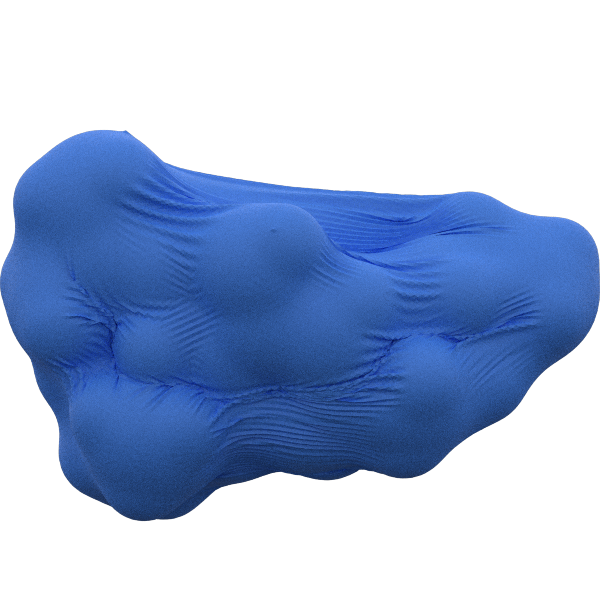

In [553]:
import fresnel
scene1 = fresnel.Scene()
geom = fresnel.geometry.Mesh(scene1,vertices=positions[cells].reshape(-1,3),N=1)
geom.material = fresnel.material.Material(color=fresnel.color.linear([0.25,0.5,0.9]), roughness=0.6,
                                         specular=0.4)
scene1.camera = fresnel.camera.fit(scene1,view='front', margin=0)
scene1.lights = fresnel.light.cloudy()
fresnel.pathtrace(scene1, samples=200, h=600, w=600)